# Matching one prototype with multiple tasks

In [1]:
from prototype_matching.multi_tasks import *
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy
import matplotlib.animation
from IPython.display import HTML

In [2]:

template = [(0,0), (2,0), (1, 1.732)]
sensory_map = [tuple((np.array(loc)+(np.random.random(2)*2-1)*DISTURB)+5) for loc in template]
sensory_map2 = [tuple(np.array(loc)+5) for loc in template]

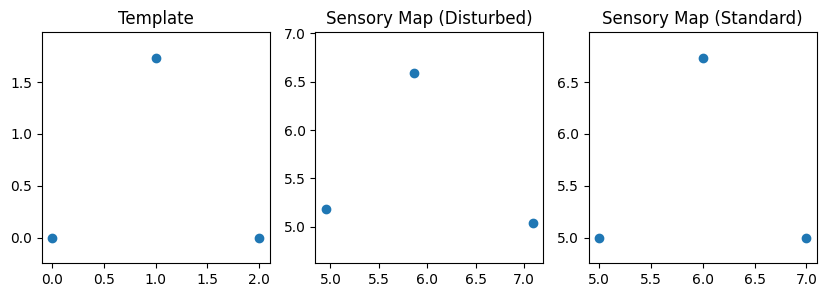

In [3]:
plt.figure(figsize=(10,3))
plt.subplot(1,3,1)
plt.title("Template")
plt.axis('equal')
plt.scatter(*zip(*template))
plt.subplot(1,3,2)
plt.title("Sensory Map (Disturbed)")
plt.axis('equal')
plt.scatter(*zip(*sensory_map))
plt.subplot(1,3,3)
plt.title("Sensory Map (Standard)")
plt.axis('equal')
plt.scatter(*zip(*sensory_map2))
plt.show()

In [4]:
template = [(0,0), (2,0), (1, 1.732)]
proto, curr_loc = create_prototype(template, SCALE, RADIUS)

In [5]:
proto.tasks

In [6]:
template = [(0,0), (2,0), (1, 1.732)]
proto, curr_loc = create_prototype(template, SCALE, RADIUS)
for task in proto.tasks:
    for mirror in task.mirrors:
        mirror.truth.revise_w(9, 9, 0)
        mirror.budget.p = 0.9

In [7]:
cs = [[[] for _ in task.mirrors] for task in proto.tasks]
ps = [[[] for _ in task.mirrors] for task in proto.tasks]

for ts in range(20):

    decay_truth(proto, ts, DURATION)
    decay_budget(proto, ts)
    for task, es_task, ps_task in zip(proto.tasks, cs, ps):
        for mirror, es_mirror, ps_mirror in zip(task.mirrors, es_task, ps_task):
            es_mirror.append(mirror.truth.c)
            ps_mirror.append(mirror.budget.p)


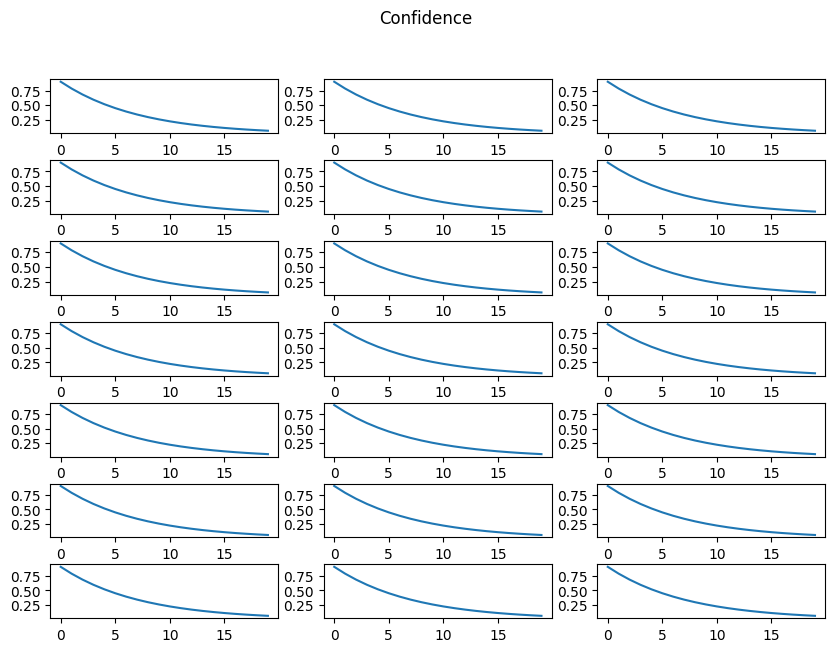

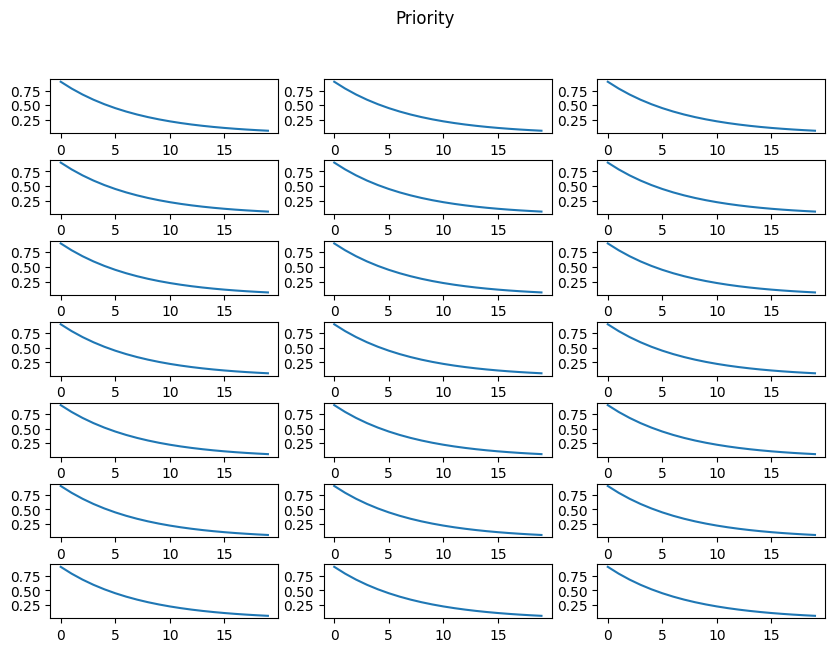

In [8]:
# plt.figure(figsize=(7, 3))
rows = len(cs)
cols = len(cs[0])
plt.figure(figsize=(10,7))
plt.suptitle("Confidence")
plt.subplots_adjust(hspace=0.5)
for i in range(rows):
    for j in range(cols):
        plt.subplot(rows, cols, i*cols+j+1)
        plt.plot(cs[i][j])
plt.figure(figsize=(10,7))
plt.suptitle("Priority")
plt.subplots_adjust(hspace=0.5)
for i in range(rows):
    for j in range(cols):
        plt.subplot(rows, cols, i*cols+j+1)
        plt.plot(ps[i][j])
plt.show()

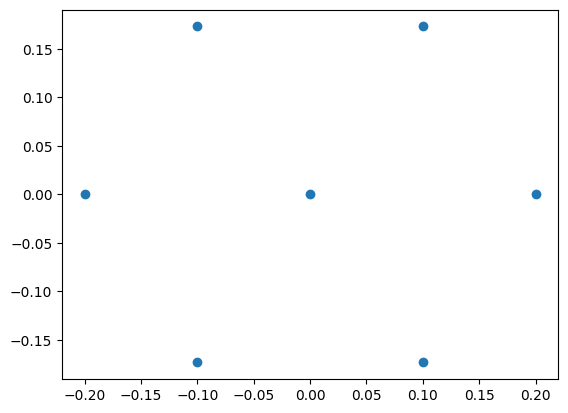

In [9]:
template = [(0,0), (2,0), (1, 1.732)]
proto, curr_loc = create_prototype(template, SCALE, RADIUS)
plt.scatter(*zip(*[task.gaze_point.center for task in proto.tasks]))

## Simulation

In [10]:
[task for task in proto.tasks if task.gaze_point.center == (0.0,0.0)]


In [11]:
[task.gaze_point for task in proto.tasks]


[Location[(0.0, 0.0)],
 Location[(0.19999999999999996, 0.0)],
 Location[(0.10000000000000009, 0.17320000000000002)],
 Location[(-0.19999999999999996, 0.0)],
 Location[(-0.09999999999999987, 0.17320000000000002)],
 Location[(-0.10000000000000009, -0.17320000000000002)],
 Location[(0.09999999999999987, -0.17320000000000002)]]

In [12]:
proto.tasks 

In [13]:
template = [(0,0), (2,0), (1, 1.732)]
proto, curr_loc = create_prototype(template, SCALE, RADIUS)
sensory_map = [(loc[0]/SCALE, loc[1]/SCALE) for loc in template]
loc_trace = []
# proto.tasks = [task for task in proto.tasks if task.gaze_point.center == (0.0,0.0)]
# proto.tasks = [proto.tasks[3]]
# proto.tasks = proto.tasks[0:2]
dx, dy = proto.tasks[3].gaze_point - curr_loc
curr_loc.move(dx, dy)
move(proto, dx, dy)

print(curr_loc.center, proto.tasks[0].gaze_point.center)
es = [[[] for _ in task.mirrors] for task in proto.tasks]
ps = [[[] for _ in task.mirrors] for task in proto.tasks]
tps = [[] for _ in proto.tasks]
mirrs = []
lifetime = 150
for ts in range(lifetime):
    loc_trace.append(deepcopy(curr_loc.center))
    """ Where to see next """
    task, mirror = take(proto) # decision making: where to see next
    mirror.anticipation.revise_w(1, 1, ts)
    """ Decay """
    decay_truth(proto, ts, DURATION)
    decay_budget(proto, ts)
    """ Move """
    dx, dy = mirror.location - task.gaze_point
    move(proto, dx, dy)
    curr_loc.move(dx, dy)
    """ Get the features around the current location """
    features = [loc for loc in sensory_map if np.linalg.norm(np.array(loc)-np.array(curr_loc.center)) < RADIUS/SCALE]
    features = [tuple(np.array(loc)-np.array(curr_loc.center)+np.array(mirror.location.center)) for loc in features]
    """ update the tasks and the mirrors in the prototype """
    for _task, es_task, ps_task, tps_task in zip(proto.tasks, es, ps, tps):
        tps_task.append(_task.budget.p)
        for _mirror, es_mirror, ps_mirror in zip(_task.mirrors, es_task, ps_task):
            es_mirror.append(_mirror.truth.e)
            ps_mirror.append(_mirror.budget.p)
        
    update_proto(proto, mirror, features, ts)

(-0.19999999999999996, 0.0) (-0.19999999999999996, 0.0)


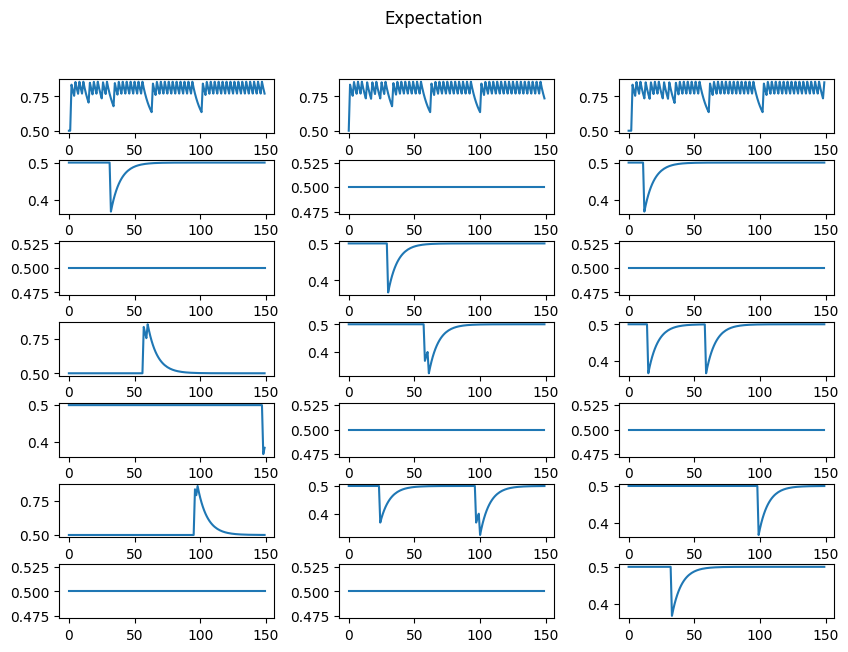

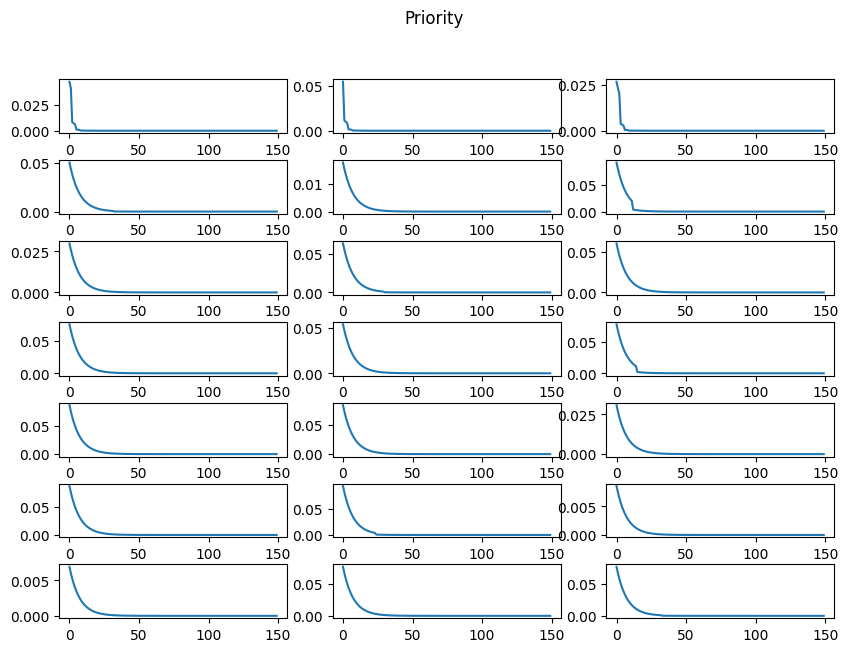

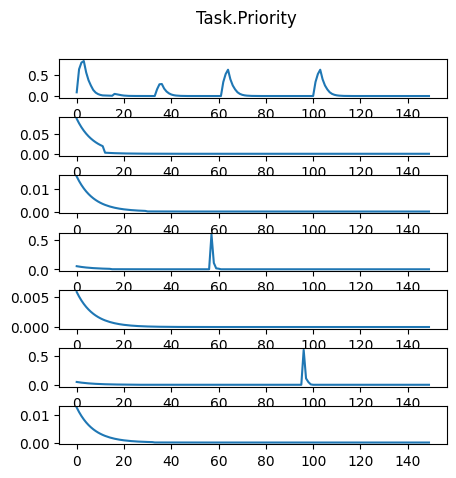

In [14]:
rows = len(es)
cols = len(es[0])
# plt.figure(figsize=(10,2))
plt.figure(figsize=(10,7))
plt.suptitle("Expectation")
plt.subplots_adjust(hspace=0.5, wspace=0.3)
for i in range(rows):
    for j in range(cols):
        plt.subplot(rows, cols, i*cols+j+1)
        plt.plot(es[i][j])
# plt.figure(figsize=(10,2))
# plt.savefig("expectation.pdf")
plt.figure(figsize=(10,7))
plt.suptitle("Priority")
plt.subplots_adjust(hspace=0.5)
for i in range(rows):
    for j in range(cols):
        plt.subplot(rows, cols, i*cols+j+1)
        plt.plot(ps[i][j])
plt.figure(figsize=(5,5))
plt.suptitle("Task.Priority")
plt.subplots_adjust(hspace=0.5)
for i in range(rows):
    plt.subplot(rows, 1, i+1)
    plt.plot(tps[i])
plt.show()

In [15]:
ts += 1

loc_trace.append(deepcopy(curr_loc.center))
""" Where to see next """
task, mirror = take(proto) # decision making: where to see next
mirror.anticipation.revise_w(1, 1, ts)
""" Decay """
decay_truth(proto, ts, DURATION)
decay_budget(proto, ts)
""" Move """
dx, dy = mirror.location - task.gaze_point
move(proto, dx, dy)
curr_loc.move(dx, dy)
""" Get the features around the current location """
features = [loc for loc in sensory_map if np.linalg.norm(np.array(loc)-np.array(curr_loc.center)) < RADIUS/SCALE]
features = [tuple(np.array(loc)-np.array(curr_loc.center)+np.array(mirror.location.center)) for loc in features]
""" update the tasks and the mirrors in the prototype """
update_proto(proto, mirror, features, ts)

In [16]:
_ps = np.array(ps)
print(_ps.shape)
_ps[:, :, -1]

(7, 3, 150)


array([[1.05461633e-41, 1.28459367e-41, 5.41224304e-42],
       [1.07368826e-11, 1.91123338e-11, 2.09229842e-11],
       [3.19278837e-11, 1.37275161e-11, 6.51481636e-11],
       [3.26339377e-12, 2.30831727e-12, 3.46609505e-12],
       [1.88012864e-11, 8.89723027e-11, 3.28981290e-11],
       [3.75721187e-12, 8.21836292e-13, 1.83265625e-12],
       [7.40441551e-12, 8.13698821e-11, 1.64394222e-11]])

In [17]:
task, mirror = take(proto) # decision making: where to see next

In [18]:
[task.budget.p for task in proto.tasks]

[3.254523881314724e-12,
 2.0333480947349345e-12,
 2.2431335192172865e-12,
 0.0,
 8.500094849880838e-13,
 0.0,
 1.884204059668131e-12]

In [19]:
[task.gaze_point for task in proto.tasks]

[Location[(0.0, 0.0)],
 Location[(0.19999999999999973, 0.0)],
 Location[(0.10000000000000009, 0.17320000000000002)],
 Location[(-0.19999999999999996, 0.0)],
 Location[(-0.09999999999999987, 0.17320000000000002)],
 Location[(-0.09999999999999987, -0.17320000000000002)],
 Location[(0.09999999999999964, -0.17320000000000002)]]

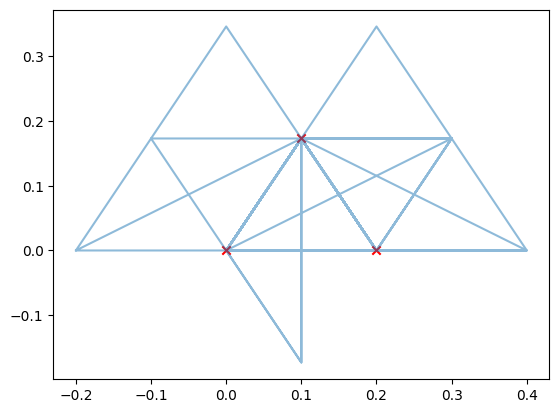

In [20]:
plt.plot(*zip(*loc_trace), alpha=0.5)
# plt.scatter(*zip(*[(task.gaze_point.center[0], task.gaze_point.center[1]) for task in proto.tasks]), c='r')
plt.scatter(*zip(*sensory_map), c='r', marker='x')
plt.show()

In [43]:
import matplotlib.pyplot as plt
import matplotlib.animation

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.figure()
plt.ioff()
fig, ax = plt.subplots()

loc_last = loc_trace[0]
def animate(t):
    global loc_last
    plt.cla()
    # if t == 0:
    #     return
    loc = loc_trace[t]
    plt.scatter(*zip(*sensory_map), c='r', marker='x')
    plt.plot(*zip(*loc_trace[:t]), alpha=0.5)
    plt.plot([loc_last[0], loc[0]], [loc_last[1], loc[1]], c='orange')
    loc_last = loc
    
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(loc_trace))
HTML(ani.to_jshtml())

In [22]:
loc_trace

[(-0.19999999999999996, 0.0),
 (0.20000000000000018, 0.0),
 (0.0, 0.0),
 (0.10000000000000009, 0.17320000000000002),
 (0.19999999999999973, 0.0),
 (0.0, 0.0),
 (0.10000000000000009, 0.17320000000000002),
 (0.19999999999999973, 0.0),
 (0.0, 0.0),
 (0.10000000000000009, 0.17320000000000002),
 (0.19999999999999973, 0.0),
 (0.0, 0.0),
 (-0.09999999999999942, 0.17320000000000002),
 (0.10000000000000009, 0.17320000000000002),
 (0.19999999999999973, 0.0),
 (0.30000000000000027, 0.17320000000000002),
 (0.0, 0.0),
 (0.10000000000000009, 0.17320000000000002),
 (0.19999999999999973, 0.0),
 (0.0, 0.0),
 (0.10000000000000009, 0.17320000000000002),
 (0.19999999999999973, 0.0),
 (0.0, 0.0),
 (0.10000000000000009, 0.17320000000000002),
 (0.30000000000000004, 0.17320000000000002),
 (0.20000000000000018, 0.0),
 (0.0, 0.0),
 (0.10000000000000009, 0.17320000000000002),
 (0.19999999999999973, 0.0),
 (0.0, 0.0),
 (0.09999999999999964, -0.17320000000000002),
 (0.09999999999999964, 0.17320000000000002),
 (-0.

In [23]:
len(loc_trace)

151

### 可视化轨迹

In [24]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Polygon
import os

# ========== 参数 ==========
# 三个目标点（你可以替换为你自己的）
targets = np.array([[0, 0], [2, 2], [4, 0]])

# 移动轨迹：目标点的索引序列
trajectory = [0, 1, 2, 0, 1, 2, 0]  # 共 6 段

# 轨迹转换为坐标序列
positions = targets[trajectory]

# ========== 绘图函数 ==========

def draw_triangle(ax, p0, p1, width=1.0, color='blue', alpha=1.0):
    """绘制从 p0 到 p1 的三角形箭头，宽度在 p1"""
    v = p1 - p0
    if np.linalg.norm(v) == 0:
        return  # 避免除零
    v_norm = v / np.linalg.norm(v)
    n = np.array([-v_norm[1], v_norm[0]])  # 法向量
    left = p1 + n * width / 2
    right = p1 - n * width / 2
    triangle = np.array([p0, left, right])
    patch = Polygon(triangle, closed=True, facecolor=color, alpha=alpha, edgecolor='none')
    ax.add_patch(patch)


In [25]:
import matplotlib.pyplot as plt

def draw_frames(loc_trace, sensory_map, t_start, n_frames, width=0.05, fig=None, fig_size=(20, 3)):
    color_trace = "blue"
    color_target = "#94070A"
    color_ref = "orange"
    if fig is None:
        fig = plt.figure(figsize=fig_size or (20, 3))
    # plt.subplots(1, n_frames)
    width = 0.05
    for i in range(n_frames):
        t = t_start + i
        if t < 1:
            continue
        ax = plt.subplot(1, n_frames, i+1)
        # ax.set_title(f"t = {t}")
        
        
        loc1 = np.array(loc_trace[t])
        loc2 = np.array(loc_trace[t-1])
        if np.sqrt(np.sum(np.square(loc2-loc1))) > 1e-3:
            draw_triangle(ax, loc2, loc1, width=width, color=color_trace, alpha=0.5)
        else:
            ax.scatter(loc1[0], loc1[1], c=color_trace, marker='o', s=30)

        ax.scatter(loc1[0], loc1[1], c=color_target, marker='o')
        ax.scatter(loc2[0], loc2[1], c=color_target, marker='o')
        if t >=2:
            loc3 = np.array(loc_trace[t-2])
            if np.sqrt(np.sum(np.square(loc3-loc2))) > 1e-3:
                draw_triangle(ax, loc3, loc2, width=width, color='blue', alpha=0.1)
            else:
                ax.scatter(loc3[0], loc3[1], c=color_trace, marker='o', s=30)
            ax.scatter(loc3[0], loc3[1], c=color_target, marker='o')
        ax.scatter(*zip(*sensory_map), c=color_ref, marker='x')

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlim(-0.3, 0.5)
        ax.set_ylim(-0.3, 0.5)


    fig.tight_layout()
    return fig

In [40]:
fontsize = 36

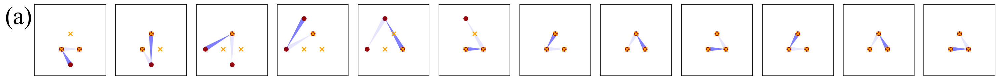

In [41]:
t_start = 30
n_frames = 12
fig = draw_frames(loc_trace, sensory_map, t_start, n_frames, width=0.05)
fig.subplots_adjust(left=0.03, right=1, top=1, bottom=0.0)
fig.text(0.000, 0.65, "(a)", ha='left', va='center', fontsize=fontsize, fontname='Times New Roman')
plt.savefig("prototype_matching_frames1.pdf", bbox_inches='tight')
plt.show()

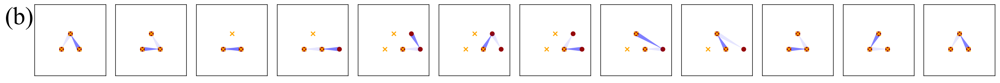

In [42]:
t_start = 55
n_frames = 12
fig = draw_frames(loc_trace, sensory_map, t_start, n_frames, width=0.05)
fig.subplots_adjust(left=0.03, right=1, top=1, bottom=0.0)
fig.text(0.000, 0.65, "(b)", ha='left', va='center', fontsize=fontsize, fontname='Times New Roman')
plt.savefig("prototype_matching_frames2.pdf", bbox_inches='tight')
plt.show()


### animation

In [44]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from matplotlib.patches import Polygon

# ==== 动画函数 ====
def animate_trace(loc_trace, sensory_map, width=0.05, xlim=(-0.3, 0.5), ylim=(-0.3, 0.5), interval=300):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_aspect('equal')
    ax.set_xticks([])
    ax.set_yticks([])

    # 动画帧更新函数
    def update(t):
        ax.cla()  # 清除上一帧内容
        ax.set_xlim(*xlim)
        ax.set_ylim(*ylim)
        ax.set_aspect('equal')
        ax.set_xticks([])
        ax.set_yticks([])

        if t < 1:
            return

        loc1 = np.array(loc_trace[t])
        loc2 = np.array(loc_trace[t - 1])

        if np.linalg.norm(loc2 - loc1) > 1e-3:
            draw_triangle(ax, loc2, loc1, width=width, color='blue', alpha=0.5)
        else:
            ax.scatter(*loc1, c='blue', marker='o', s=30)

        ax.scatter(*loc1, c='red', marker='o')
        ax.scatter(*loc2, c='red', marker='o')

        if t >= 2:
            loc3 = np.array(loc_trace[t - 2])
            if np.linalg.norm(loc3 - loc2) > 1e-3:
                draw_triangle(ax, loc3, loc2, width=width, color='blue', alpha=0.1)
            else:
                ax.scatter(*loc3, c='blue', marker='o', s=30)
            ax.scatter(*loc3, c='red', marker='o')

        if sensory_map:
            ax.scatter(*zip(*sensory_map), c='orange', marker='x')

        ax.set_title(f"t = {t}", fontsize=10)

    ani = animation.FuncAnimation(fig, update, frames=len(loc_trace), interval=interval)
    return ani


In [47]:
ani = animate_trace(loc_trace, sensory_map, width=0.02)

ani.save("trace_animation.gif", writer='pillow', fps=10)


In [48]:
HTML(ani.to_jshtml())
